<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;">

# <center> Проект: Анализ резюме из HeadHunter
   

In [80]:
import re
from typing import Literal

import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

# Исследование структуры данных

1. Прочитайте данные с помощью библиотеки Pandas. Совет: перед чтением обратите внимание на разделитель внутри файла. 

In [81]:
FILE_DATA_PATH = "dst-3.0_16_1_hh_database.csv"

df = pd.read_csv(FILE_DATA_PATH, sep=";")


    # Задание 2.1
Чему равна размерность таблицы? Введите её в виде кортежа (число строк, число столбцов).

In [82]:
print(f"Размерность равна {df.shape}")
assert df.shape == (44744, 12)

Размерность равна (44744, 12)


2. Выведите несколько первых (последних) строк таблицы, чтобы убедиться в том, что ваши данные не повреждены. Ознакомьтесь с признаками и их структурой.

In [83]:
n_head = 10
print(f"Первые {n_head} строк таблицы")
df.head(n_head)

Первые 10 строк таблицы


,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,Неоконченное высшее образование 2000 Балтийск...,16.04.2019 15:59,Имеется собственный автомобиль
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",Высшее образование 1981 Военно-космическая ак...,12.04.2019 08:42,Не указано
2,"Женщина , 36 лет , родилась 12 августа 1982",20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,Среднее специальное образование 2002 Профессио...,16.04.2019 08:35,Не указано
3,"Мужчина , 38 лет , родился 25 июня 1980",100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"Саратов , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",Опыт работы 18 лет 9 месяцев Август 2017 — Ап...,OpenSoft,Инженер-программист,Высшее образование 2002 Саратовский государст...,08.04.2019 14:23,Не указано
4,"Женщина , 26 лет , родилась 3 марта 1993",140000 руб.,Региональный менеджер по продажам,"Москва , не готова к переезду , готова к коман...",полная занятость,полный день,Опыт работы 5 лет 7 месяцев Региональный мене...,Мармелад,Менеджер по продажам,Высшее образование 2015 Кгу Психологии и педаг...,22.04.2019 10:32,Не указано
5,"Мужчина , 29 лет , родился 5 октября 1989",25000 руб.,Технический специалист,"Старый Оскол , не готов к переезду , не готов ...",полная занятость,"полный день, сменный график",Опыт работы 9 лет 9 месяцев Технический специ...,Комбинат хлебопродуктов Старооскольский,Слесарь КИПиА,Неоконченное высшее образование 2013 Воронежс...,22.04.2019 15:59,Имеется собственный автомобиль
6,"Мужчина , 46 лет , родился 19 сентября 1972",250000 руб.,Руководитель ИТ-проектов,"Москва , не готов к переезду , готов к редким ...",полная занятость,полный день,Опыт работы 22 года 9 месяцев Руководитель ИТ...,"СИБИНТЕК, ООО ИК",Менеджер (Руководитель ИТ-проектов),Высшее образование 2008 ФГОУ ВПО «Уральская ак...,25.04.2019 22:48,Не указано
7,"Мужчина , 29 лет , родился 9 июля 1989",70000 руб.,Инженер АСУ ТП,"Москва , м. Бульвар Рокоссовского , готов к п...",полная занятость,полный день,Опыт работы 3 года 11 месяцев Декабрь 2016 — ...,ФМ-инжиниринг,Инженер АСУ ТП,Высшее образование 2014 Белорусская Государств...,07.05.2019 17:59,Не указано
8,"Мужчина , 29 лет , родился 11 июля 1989",65000 руб.,Ревизор,"Москва , м. Шоссе Энтузиастов , готов к перее...",полная занятость,полный день,Опыт работы 8 лет 9 месяцев Декабрь 2016 — по...,ФГБУ РСВО,Старший специалист,Неоконченное высшее образование 2020 Московск...,11.04.2019 11:08,Имеется собственный автомобиль
9,"Мужчина , 34 года , родился 26 мая 1984",55000 руб.,"Менеджер по работе с клиентами, Pre-sale менед...","Москва , м. Теплый Стан , не готов к переезду...",полная занятость,полный день,Опыт работы 16 лет 6 месяцев Июнь 2018 — по н...,"ООО ""Мираском""",Специалист отдела ИТ,Высшее образование 2007 Московский государств...,19.04.2019 11:39,Имеется собственный автомобиль


# Задание 2.2
В каком формате представлен порядок слов в признаке «Пол, возраст»?

In [84]:
assert "Пол , возраст , дата рождения"

In [85]:
n_tail = 10
print(f"Последние {n_tail} строк таблицы")
df.tail(n_tail)

Последние 10 строк таблицы


,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
44734,"Мужчина , 23 года , родился 12 августа 1995",85000 руб.,Технический специалист со знанием нем/англ языков,"Москва , м. Коломенская , готов к переезду , ...",полная занятость,"гибкий график, полный день",Опыт работы 4 года 9 месяцев Август 2018 — по...,Plazius,Инженер технической поддержки,Высшее образование 2018 Московский государств...,07.05.2019 11:42,Имеется собственный автомобиль
44735,"Мужчина , 25 лет , родился 29 апреля 1993",70000 руб.,Тестировщик ПО Работу уже нашёл,"Москва , м. Сокольники , не готов к переезду ...",полная занятость,полный день,Опыт работы 2 года 4 месяца Тестировщик ПО Ра...,Юрайт,Тестировщик ПО,Высшее образование 2014 Московский государств...,21.09.2018 11:26,Не указано
44736,"Мужчина , 32 года , родился 26 января 1987",800 бел.руб.,"мастер по ремонту, водитель,продавец-консультант","Новополоцк , готов к переезду , готов к команд...","частичная занятость, полная занятость","гибкий график, полный день, сменный график",Опыт работы 10 лет 5 месяцев мастер по ремонт...,"""Электросервис и ко""",Специалист по продажам,Высшее образование 2011 Полоцкий государственн...,22.04.2019 01:03,Не указано
44737,"Мужчина , 31 год , родился 8 сентября 1987",70000 руб.,Руководитель IT-отдела,"Санкт-Петербург , м. Горьковская , не готов к...",полная занятость,полный день,Опыт работы 12 лет 8 месяцев Сентябрь 2013 — ...,ООО «Сендика Груп»,Руководитель отдела IT,Высшее образование 2010 Санкт-Петербургский г...,05.04.2019 18:05,Не указано
44738,"Мужчина , 37 лет , родился 12 марта 1982",150000 руб.,head of helpdesk,"Москва , м. Пятницкое шоссе , готов к переезд...",полная занятость,полный день,Опыт работы 17 лет 1 месяц Май 2017 — по наст...,"Будущее, НПФ",Начальник отдела технического обеспечения,Высшее образование 2005 Московский Государстве...,08.04.2019 09:47,Не указано
44739,"Мужчина , 30 лет , родился 17 января 1989",50000 руб.,"Финансист, аналитик, экономист, бухгалтер, мен...","Тверь , готов к переезду (Москва, Химки) , гот...",полная занятость,"полный день, удаленная работа","Опыт работы 7 лет 7 месяцев Финансист, аналит...","ООО ""IAS"" (независимый участник объединения Ru...",Руководитель субгруппы,Высшее образование 2015 Московский гуманитарн...,22.04.2019 12:32,Не указано
44740,"Мужчина , 27 лет , родился 5 марта 1992",39000 руб.,"Системный администратор, IT-специалист","Липецк , готов к переезду , готов к командировкам","проектная работа, частичная занятость, полная ...","удаленная работа, гибкий график, полный день, ...","Опыт работы 7 лет Системный администратор, IT...",ИП Пестрецов,Предприниматель,Высшее образование (Бакалавр) 2016 Воронежски...,22.04.2019 13:11,Не указано
44741,"Женщина , 48 лет , родилась 26 декабря 1970",40000 руб.,"Аналитик данных, Математик","Челябинск , готова к переезду , готова к редки...",полная занятость,"полный день, удаленная работа",Опыт работы 21 год 5 месяцев Январь 1998 — по...,"ОАО «ЧМК», Исследовательско-Технологический Це...",Начальник группы аналитики,Высшее образование 2000 Южно-Уральский госуда...,09.04.2019 05:07,Не указано
44742,"Мужчина , 24 года , родился 6 октября 1994",20000 руб.,Контент-менеджер,"Тамбов , не готов к переезду , не готов к кома...","частичная занятость, полная занятость",удаленная работа,Опыт работы 3 года 10 месяцев Контент-менедже...,IQ-Maxima,Менеджер проектов,Высшее образование 2015 Тамбовский государств...,26.04.2019 14:25,Имеется собственный автомобиль
44743,"Мужчина , 38 лет , родился 25 апреля 1980",120000 руб.,Руководитель проекта,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 15 лет 10 месяцев Руководитель пр...,ПАО ГК ТНС энерго,Руководитель отдела технической поддержки,Высшее образование 1997 Южно-Российский госуд...,05.07.2018 20:15,Не указано


3. Выведите основную информацию о числе непустых значений в столбцах и их типах в таблице.

# Задание 2.3
Какой тип данных имеют все столбцы?

In [86]:
assert all(df.dtypes == object)

4. Обратите внимание на информацию о числе непустых значений.

In [87]:
print("Основная информация о числе непустых значений в столбцах и их типах в таблице:")
df.info()

Основная информация о числе непустых значений в столбцах и их типах в таблице:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто          

# Задание 2.4
Выберите все признаки, в которых есть пропуски в данных:

In [88]:
assert "Последняя/нынешняя должность"
assert "Опыт работы"
assert "Последнее/нынешнее место работы"

5. Выведите основную статистическую информацию о столбцах.


In [89]:
print("Основная статистическая информация о столбцах:")
df.describe().transpose()

Основная статистическая информация о столбцах:


,count,unique,top,freq
"Пол, возраст",44744,16003,"Мужчина , 32 года , родился 17 сентября 1986",18
ЗП,44744,690,50000 руб.,4064
Ищет работу на должность:,44744,14929,Системный администратор,3099
"Город, переезд, командировки",44744,10063,"Москва , не готов к переезду , не готов к кома...",1261
Занятость,44744,38,полная занятость,30026
График,44744,47,полный день,22727
Опыт работы,44576,44413,Опыт работы 10 лет 8 месяцев Апрель 2018 — по...,3
Последнее/нынешнее место работы,44743,30214,Индивидуальное предпринимательство / частная п...,935
Последняя/нынешняя должность,44742,16927,Системный администратор,2062
Образование и ВУЗ,44744,40148,Высшее образование 1987 Военный инженерный Кра...,4


# Задание 2.5
Сколько уникальных значений содержится в столбце «Опыт работы»?

In [90]:
assert df["Опыт работы"].nunique() == 44413

Какая из искомых должностей самая распространённая?

In [91]:
assert df["Последняя/нынешняя должность"].value_counts().index[0] == "Системный администратор"

# Преобразование данных

1. Начнем с простого - с признака **"Образование и ВУЗ"**. Его текущий формат это: **<Уровень образования год выпуска ВУЗ специальность...>**. Например:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…
Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак **"Образование"**, который должен иметь 4 категории: "высшее", "неоконченное высшее", "среднее специальное" и "среднее".

Выполните преобразование, ответьте на контрольные вопросы и удалите признак "Образование и ВУЗ".

Совет: обратите внимание на структуру текста в столбце **"Образование и ВУЗ"**. Гарантируется, что текущий уровень образования соискателя всегда находится в первых 2ух слов и начинается с заглавной буквы. Воспользуйтесь этим.

*Совет: проверяйте полученные категории, например, с помощью метода unique()*


# Задание 3.1 
Сколько соискателей имеет средний уровень образования (школьное образование)?

In [92]:
def transform_education(education_and_university: str) -> Literal["высшее", "неоконченное высшее", "среднее специальное", "среднее"]:
    """Функция для трансформации признака "Образование и ВУЗ" в признак "Образование
    
    Args:
        education_and_university (str): строка с информацией об образовании и ВУЗе
    
    Returns:
        Literal["высшее", "неоконченное высшее", "среднее специальное", "среднее"]: уровень образования
    """
    education_and_university = education_and_university.lower()
    
    if education_and_university.startswith("неоконченное высшее"):
        return "неоконченное высшее"
    elif education_and_university.startswith("высшее"):
        return "высшее"
    elif education_and_university.startswith("среднее специальное"):
        return "среднее специальное"
    elif education_and_university.startswith("среднее"):
        return "среднее"
    else:
        raise ValueError(f"Неизвестное образование: {education_and_university}")

df["Образование"] = df["Образование и ВУЗ"].apply(transform_education)


In [93]:
print("Количество соискателей со средним уровнем образования равно:")
print(df[df["Образование"] == "среднее"].shape[0])
assert df[df["Образование"] == "среднее"].shape[0] == 559

Количество соискателей со средним уровнем образования равно:
559


2. Теперь нас интересует столбец **"Пол, возраст"**. Сейчас он представлен в формате **<Пол , возраст , дата рождения >**. Например:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000
Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец.

Создайте два новых признака **"Пол"** и **"Возраст"**. При этом важно учесть:
* Признак пола должен иметь 2 уникальных строковых значения: 'М' - мужчина, 'Ж' - женщина. 
* Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак **"Пол, возраст"** из таблицы.

*Совет: обратите внимание на структуру текста в столбце, в части на то, как разделены параметры пола, возраста и даты рождения между собой - символом ' , '. 
Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.*


In [94]:
def convert_gender(gender_and_age: str) -> Literal["М", "Ж"]:
    """Конвертация пола и возраста в пол.
    
    Args:
        gender_and_age (str): строка с информацией о поле и возрасте
    
    Returns:
        Literal["М", "Ж"]: пол
    """
    gender = gender_and_age.split(",")[0].strip().lower()
    
    if gender == "мужчина":
        return "М"
    
    if gender == "женщина":
        return "Ж"
    
    raise ValueError(f"Неизвестный пол: {gender}")


def convert_age(age_and_gender: str) -> int:
    """Конвертация пола и возраста в возраст.
    
    Args:
        age_and_gender (str): строка с информацией о поле и возрасте
    
    Returns:
        int: возраст
    """
    
    return int(age_and_gender.split(",")[1].strip().split()[0])

df["Пол"] = df["Пол, возраст"].apply(convert_gender)
df["Возраст"] = df["Пол, возраст"].apply(convert_age)


# Задание 3.2 
Сколько процентов женских резюме представлено в наших данных? Ответ округлите до сотых.

In [95]:
print("Процент женских резюме равен:")
print(round(df[df["Пол"] == "Ж"].shape[0] / df.shape[0] * 100, 2))
assert round(df[df["Пол"] == "Ж"].shape[0] / df.shape[0] * 100, 2) == 19.07


Процент женских резюме равен:
19.07


Чему равен средний возраст соискателей? Ответ округлите до десятых.

In [96]:
print("Средний возраст соискателей равен:")
print(round(df["Возраст"].mean(), 1))
assert round(df["Возраст"].mean(), 1) == 32.2

Средний возраст соискателей равен:
32.2


3. Следующим этапом преобразуем признак **"Опыт работы"**. Его текущий формат - это: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>**. 

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовем "Опыт работы (месяц)"

Для начала обсудим условия решения задачи:
* Во-первых, в данном признаке есть пропуски. Условимся, что если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN)
* Во-вторых, в данном признаке есть скрытые пропуски. Для некоторых соискателей в столбце стоит значения "Не указано". Их тоже обозначим как NaN (функция-преобразование возвращает NaN)
* В-третьих, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях)
* В-четвертых, у нас есть проблема: опыт работы может быть представлен только в годах или только месяцах. Например, можно встретить следующие варианты:
    * Опыт работы 3 года 2 месяца…
    * Опыт работы 4 года…
    * Опыт работы 11 месяцев…
    * Учитывайте эту особенность в вашем коде

Учитывайте эту особенность в вашем коде

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.
Выполните преобразование, ответьте на контрольные вопросы и удалите столбец **"Опыт работы"** из таблицы.


In [97]:
def convert_experience(experience: str | float) -> int | float:
    """Конвертация опыта работы в месяцах.
    
    Args:
        experience: строка с информацией об опыте работы
    
    Returns:
        опыт работы в месяцах
    """
    years_pattern = r"(\d+) (год|лет)"
    months_pattern = r"(\d+) месяц"
    
    if experience is np.nan:
        return np.nan
    
    if experience.lower().startswith("не указано"):
        return np.nan
 
    years = re.search(years_pattern, experience[:35])
    months = re.search(months_pattern, experience[:35])
    
    if years is None and months is None:
        raise ValueError(f"Неизвестный опыт работы: {experience}")
    
    if years is not None:
        years = int(years.groups()[0])
    else:
        years = 0
    
    if months is not None:
        months = int(months.groups()[0])
    else:
        months = 0
    
    return int(years * 12 + months)


df["Опыт работы (месяц)"] = df["Опыт работы"].apply(convert_experience)

In [98]:
df.drop(columns=["Опыт работы"], inplace=True)

# Задание 3.3 
Чему равен медианный опыт работы (в месяцах) в нашей таблице?


In [99]:
print("Медианный опыт работы (в месяцах) в нашей таблице равен:")
print(df["Опыт работы (месяц)"].median())
assert df["Опыт работы (месяц)"].median() == 100.0

Медианный опыт работы (в месяцах) в нашей таблице равен:
100.0


4. Хорошо идем! Следующий на очереди признак "Город, переезд, командировки". Информация в нем представлена в следующем виде: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>**. В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

Создадим отдельные признаки **"Город"**, **"Готовность к переезду"**, **"Готовность к командировкам"**. При этом важно учесть:

* Признак **"Город"** должен содержать только 4 категории: "Москва", "Санкт-Петербург" и "город-миллионник" (их список ниже), остальные обозначьте как "другие".

    Список городов-миллионников:
    
   <code>million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    </code>
    Инфорация о метро, рядом с которым проживает соискатель нас не интересует.
* Признак **"Готовность к переезду"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке "Город, переезд, командировки". Например:
    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …
    
    Нас интересует только сам факт возможности или желания переезда.
* Признак **"Готовность к командировкам"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке "Город, переезд, командировки". Например:
    * … , готов к командировкам , … 
    * … , готова к редким командировкам , …
    * … , не готов к командировкам , …
    
    Нас интересует только сам факт готовности к командировке.
    
    Еще один важный факт: при выгрузки данных у некоторых соискателей "потерялась" информация о готовности к командировкам. Давайте по умолчанию будем считать, что такие соискатели не готовы к командировкам.
    
Выполните преобразования и удалите столбец **"Город, переезд, командировки"** из таблицы.

*Совет: обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. Учите это, если будете использовать порядок слов в своей программе.*


In [100]:
million_cities = frozenset(
    ('Новосибирск', 'Екатеринбург','Нижний Новгород',
     'Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 
     'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград')
)


def convert_city(city: str) -> Literal["Москва", "Санкт-Петербург", "город-миллионник", "другие"]:
    """Конвертация города в категорию.
    
    Args:
        city (str): строка с информацией о городе
    
    Returns:
        Literal["Москва", "Санкт-Петербург", "город-миллионник", "другие"]: категория города
    """
    city = city.split(",")[0].strip()
    
    if not city:
        return "другие"
    
    if city.lower() == "москва":
        return "Москва"
    
    if city.lower() == "санкт-петербург":
        return "Санкт-Петербург"
    
    if city in million_cities:
        return "город-миллионник"
    
    return "другие"


def convert_relocation(relocation: str) -> bool:
    """Конвертация готовности к переезду.
    
    Args:
        relocation (str): строка с информацией о готовности к переезду
    
    Returns:
        bool: готовность к переезду
    """
    pattern = r"не готов[а]? к пере|готов[а]? к пере|хочу пере|не хочу пере"
    response = re.search(pattern, relocation)
    if response is None:
        raise ValueError(f"Неизвестная готовность к переезду: {relocation}")
    
    response = response.group()
    if response.startswith("не"):
        return False
    return True


def convert_business_trip(business_trip: str) -> bool:
    """Конвертация готовности к командировкам.
    
    Args:
        business_trip (str): строка с информацией о готовности к командировкам
        
    Returns:
        bool: готовность к командировкам
    """
    pattern = r"не готов[а]? к (редким )?командировкам|готов[а]? к (редким )?командировкам"
    response = re.search(pattern, business_trip)
    
    if response is None:
        return False
    
    response = response.group()
    if response.startswith("не"):
        return False
    return True

df["Город"] = df["Город, переезд, командировки"].apply(convert_city)
df["Готовность к переезду"] = df["Город, переезд, командировки"].apply(convert_relocation)
df["Готовность к командировкам"] = df["Город, переезд, командировки"].apply(convert_business_trip)


In [101]:
df.drop(columns=["Город, переезд, командировки"], inplace=True)

# Задание 3.4 
Сколько процентов соискателей живут в Санкт-Петербурге? Ответ округлите до целого.


In [102]:
print("Процент соискателей, живущих в Санкт-Петербурге, равен:")
print(round(df[df["Город"] == "Санкт-Петербург"].shape[0] / df.shape[0] * 100))
assert round(df[df["Город"] == "Санкт-Петербург"].shape[0] / df.shape[0] * 100) == 11

Процент соискателей, живущих в Санкт-Петербурге, равен:
11


Сколько процентов соискателей готовы одновременно и к переездам, и к командировкам? Ответ округлите до целого.

In [103]:
print("Процент соискателей, готовых одновременно и к переездам, и к командировкам, равен:")
print(round(df[(df["Готовность к переезду"] == True) & (df["Готовность к командировкам"] == True)].shape[0] / df.shape[0] * 100))
assert round(df[(df["Готовность к переезду"] == True) & (df["Готовность к командировкам"] == True)].shape[0] / df.shape[0] * 100) == 32

Процент соискателей, готовых одновременно и к переездам, и к командировкам, равен:
32


5. Рассмотрим поближе признаки **"Занятость"** и **"График"**. Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтерство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удаленная работа, вахтовый метод).
На сайте hh.ru соискатель может указывать различные комбинации данных категорий, например:
* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

Такой вариант признаков имеет множество различных комбинаций, а значит множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-мигалки для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе - False.

Такой метод преобразования категориальных признаков называется One Hot Encoding и его схема представлена на рисунке ниже:
<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg>
Выполните данное преобразование для признаков "Занятость" и "График", ответьте на контрольные вопросы, после чего удалите их из таблицы

In [104]:
one_hot_encoding_employment = pd.get_dummies(df["Занятость"].str.split(", ").apply(pd.Series).stack()).groupby(level=0).sum().astype(bool)
one_hot_encoding_schedule = pd.get_dummies(df["График"].str.split(", ").apply(pd.Series).stack()).groupby(level=0).sum().astype(bool)

df = pd.concat([df, one_hot_encoding_employment, one_hot_encoding_schedule], axis=1)

In [105]:
df.drop(columns=["Занятость", "График"], inplace=True)

# Задание 3.5 
Сколько людей ищут проектную работу и волонтёрство (в обоих столбцах стоит True)?

In [106]:
print("Количество людей, ищущих проектную работу и волонтёрство, равно:")
print(df[(df["проектная работа"] == True) & (df["волонтерство"] == True)].shape[0])
assert df[(df["проектная работа"] == True) & (df["волонтерство"] == True)].shape[0] == 436

Количество людей, ищущих проектную работу и волонтёрство, равно:
436


Сколько людей хотят работать вахтовым методом и с гибким графиком (в обоих столбцах стоит True)?

In [107]:
print("Количество людей, хотящих работать вахтовым методом и с гибким графиком, равно:")
print(df[(df["вахтовый метод"] == True) & (df["гибкий график"] == True)].shape[0])
assert df[(df["вахтовый метод"] == True) & (df["гибкий график"] == True)].shape[0] == 2311

Количество людей, хотящих работать вахтовым методом и с гибким графиком, равно:
2311


6. (2 балла) Наконец, мы добрались до самого главного и самого важного - признака заработной платы **"ЗП"**. 
В чем наша беда? В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он бы хотел ее получать, например:
* 30000 руб.
* 50000 грн.
* 550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например, в рублях. Возникает вопрос, а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации, от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако, это не тема нашего проекта.

Поэтому мы пойдем в лоб: обратимся к специальным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU, данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv файлов. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019. Скачать ее вы можете **на платформе**

Создайте новый DataFrame из полученного файла. В полученной таблице нас будут интересовать столбцы:
* "currency" - наименование валюты в ISO кодировке,
* "date" - дата, 
* "proportion" - пропорция, 
* "close" - цена закрытия (последний зафиксированный курс валюты на указанный день).


Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в нашем файле с курсами валют. Пропорция - это число, за сколько единиц валюты указан курс в таблице с курсами. Например, для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен - 17.197 / 100 = 0.17197 руб за 1 тенге.
Воспользуйтесь этой информацией в ваших преобразованиях.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


Осталось только понять, откуда брать дату, по которой определяется курс? А вот же она - в признаке **"Обновление резюме"**, в нем содержится дата и время, когда соискатель выложил текущий вариант своего резюме. Нас интересует только дата, по ней бы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы создать признак "ЗП (руб)" - заработная плата в рублях.

После ответа на контрольные вопросы удалите исходный столбец заработной платы "ЗП" и все промежуточные столбцы, если вы их создавали.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".


In [108]:
EXCHANGE_CSV_PATH = "ExchangeRates.csv"
df_ex = pd.read_csv(EXCHANGE_CSV_PATH, sep=",")
df_ex.shape

(5664, 7)

In [109]:
df["Обновление резюме"] = pd.to_datetime(df["Обновление резюме"], format="%d.%m.%Y %H:%M")
df["Обновление резюме"] = pd.to_datetime(df["Обновление резюме"].dt.date, format="%Y-%m-%d")
df_ex["date"] = pd.to_datetime(df_ex["date"], format="mixed")

In [110]:
iso_currency = {
    "руб.": "RUB",
    "бел.руб.": "BYN",
    "грн.": "UAH",
    "сум": "UZS",
    "KZT": "KZT",
    "USD": "USD",
    "EUR": "EUR",
    "KGS": "KGS",
    "AZN": "AZN",
}


def convert_currency2iso(zp: str) -> Literal["RUB", "USD", "EUR", "KZT", "BYN", "UAH"]:
    """Конвертация валюты в ISO код.
    
    Args:
        zp (str): строка с информацией о валюте
    
    Returns:
        Literal["RUB", "USD", "EUR", "KZT", "BYN", "UAH"]: ISO код валюты
    """
    currency = zp.split(" ")[-1]
    
    currency_iso = iso_currency.get(currency)
    if currency_iso is None:
        raise ValueError(f"Неизвестная валюта: {currency}")
    
    return currency_iso


def convert_desired_salary(zp: str) -> float:
    """Конвертация желаемой заработной платы в число.
    
    Args:
        zp (str): строка с информацией о желаемой заработной плате
    
    Returns:
        float: желаемая заработная плата
    """

    return float(zp.split(" ")[0])


df["Валюта ЗП (ISO)"] = df["ЗП"].apply(convert_currency2iso)
df["Желаемая ЗП"] = df["ЗП"].apply(convert_desired_salary)

In [111]:
df = df.merge(
    df_ex,
    how="left",
    left_on=["Обновление резюме", "Валюта ЗП (ISO)"],
    right_on=["date", "currency"],
)
df[["close", "proportion"]] = df[["close", "proportion"]].fillna(1, axis=1)
df["ЗП (руб)"] = df["Желаемая ЗП"] * df["close"] / df["proportion"]

# Задание 3.6
Чему равна желаемая медианная заработная плата соискателей в нашей таблице (в рублях)?

In [112]:
print("Желаемая медианная заработная плата соискателей в нашей таблице равна:")
print(round(df["ЗП (руб)"].median() / 1000))
assert round(df["ЗП (руб)"].median() / 1000) == 59

Желаемая медианная заработная плата соискателей в нашей таблице равна:
59


# Синхронизация

In [113]:
sync_columns = [
    'Ищет работу на должность:', 'Последнее/нынешнее место работы', 'Последняя/нынешняя должность',  'Обновление резюме', 
    'Авто', 'Образование', 'Пол', 'Возраст','Опыт работы (месяц)', 'Город', 'Готовность к переезду', 'Готовность к командировкам',
    'полная занятость', 'полный день', 'частичная занятость', 'сменный график', 'проектная работа', 'гибкий график',
    'волонтерство', 'удаленная работа', 'стажировка', 'вахтовый метод', 'ЗП (руб)',
]

df = df[sync_columns]

# Исследование зависимостей в данных

1. Постройте распределение признака **"Возраст"**. Опишите распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [114]:
fig = px.histogram(df, x='Возраст')
fig.update_layout(
    title="Распределение признака Возраст",
    xaxis_title="Возраст",
    yaxis_title="Количество",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    )
)
fig.show(render="png", width=1600, height=800)

fig = px.box(df, x='Возраст')
fig.update_layout(
    title="Распределение признака Возраст",
    xaxis_title="Возраст",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    )
)
fig.show(render="png", width=1600, height=800)

### Чему равна мода распределения?

In [115]:
print("Мода распределения равна:")
df["Возраст"].mode().loc[0]

Мода распределения равна:


30

In [116]:
print("Предельные значения признака равны:")
df["Возраст"].min(), df["Возраст"].max()

Предельные значения признака равны:


(14, 100)

In [117]:
print("Возраст большинства соискателей находится в интервале:")
df["Возраст"].quantile(0.25), df["Возраст"].quantile(0.75)

Возраст большинства соискателей находится в интервале:


(27.0, 36.0)

### Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
#### Да есть. Есть кандидат с возрастом 100 лет. Также есть значения возрастов меньше 18 лет. Можно отнести к аномальным значениям возраста больше границы пенсионного возраста в том числе 100 лет и меньше 18 лет.

2. Постройте распределение признака **"Опыт работы (месяц)"**. Опишите данное распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей? Есть ли аномалии для признака опыта работы, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [118]:
fig = px.histogram(df, x='Опыт работы (месяц)')
fig.update_layout(
    title="Распределение признака 'Опыт работы (месяц)'",
    xaxis_title="Опыт работы (месяц)",
    yaxis_title="Количество",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    )
)
fig.show(render="png", width=1600, height=800)

fig = px.box(df, x='Опыт работы (месяц)')
fig.update_layout(
    title="Распределение признака 'Опыт работы (месяц)'",
    xaxis_title="Опыт работы (месяц)",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    )
)
fig.show(render="png", width=1600, height=800)

### Чему равна мода распределения?

In [119]:
print("Мода распределения равна:")
int(df["Опыт работы (месяц)"].mode().loc[0])

Мода распределения равна:


81

### Каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей?

In [120]:
print("Предельные значения признака равны:")
df["Опыт работы (месяц)"].min(), df["Опыт работы (месяц)"].max()

Предельные значения признака равны:


(1.0, 1188.0)

In [121]:
print("Опыт работы большинства соискателей находится в интервале:")
df["Опыт работы (месяц)"].quantile(0.25), df["Опыт работы (месяц)"].quantile(0.75)

Опыт работы большинства соискателей находится в интервале:


(57.0, 154.0)

### Есть ли аномалии для признака? Если есть, то какие значения вы бы причислили к таковым?
#### Да,есть. Видны случаи с опытом работы более 600 месяцев, это означает, что человек работал более 50-ти лет, также есть однозначная аномалия с 1188 месячным опытом, это означает, что кандидат работал около 99 лет.

3. Постройте распределение признака **"ЗП (руб)"**. Опишите данное распределение, отвечая на следующие вопросы: каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей? Есть ли аномалии для признака возраста? Обратите внимание на гигантские размеры желаемой заработной платы.
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*


In [122]:
fig = px.histogram(df, x='ЗП (руб)')
fig.update_layout(
    title="Распределение признака 'ЗП (руб)'",
    xaxis_title="ЗП (руб)",
    yaxis_title="Количество",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    ),
)
fig.update_xaxes(type="linear", range=[0, 4 * 10 ** 5])
fig.show(render="png", width=1600, height=800)

fig = px.box(df, x='ЗП (руб)')
fig.update_layout(
    title="Распределение признака 'ЗП (руб)'",
    xaxis_title="ЗП (руб)",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    )
)
fig.update_xaxes(type="linear", range=[0, 4 * 10 ** 5])
fig.show(render="png", width=1600, height=800)

### Каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей?

In [123]:
print("Предельные значения признака ЗП большинства соискателей равны:")
df["ЗП (руб)"].quantile(0.25), df["ЗП (руб)"].quantile(0.75)


Предельные значения признака ЗП большинства соискателей равны:


(37082.2, 95000.0)

### Чему равна мода распределения?

In [124]:
print("Мода распределения равна:")
df["ЗП (руб)"].mode().loc[0]

Мода распределения равна:


50000.0

### Есть ли аномалии для признака заработной платы? Если есть, то какие значения вы бы причислили к таковым?
#### Да, есть. Есть случаи с зарплатой в 1 рубл. и зп 24 млн., 7 млн.

4. Постройте диаграмму, которая показывает зависимость **медианной** желаемой заработной платы (**"ЗП (руб)"**) от уровня образования (**"Образование"**). Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 млн рублей.
*Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

In [125]:
df_salary_ed = df[df["ЗП (руб)"] < 1_000_000].groupby("Образование")["ЗП (руб)"].median()

fig = px.bar(
    df_salary_ed,
    x=df_salary_ed.index,
    y=df_salary_ed.values,
    title="Зависимость медианной желаемой заработной платы от уровня образования",
    labels={
        "x": "Уровень образования",
        "y": "ЗП (руб)"
    },
    text="ЗП (руб)",
)

fig.update_layout(
    title='зависимость медианной желаемой заработной платы  от уровня образования'.title(),
    xaxis_title="Образование",
    yaxis_title="ЗП (руб)",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    )
)

fig.show(render="png", width=1600, height=800)

### Для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы?
#### Наивысший уровень ЗП у людей c высшим образованием, наименьший по медиане у людей со средним и среднеспециальным образованием.
### Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?
#### Да, важен. Чем выше уровень образования, тем выше уровень ЗП.

5. Постройте диаграмму, которая показывает распределение желаемой заработной платы (**"ЗП (руб)"**) в зависимости от города (**"Город"**). Используйте для диаграммы данные о резюме, где желая заработная плата меньше 1 млн рублей.
*Сделайте выводы по полученной диаграмме: как соотносятся медианные уровни желаемой заработной платы и их размах в городах? Как вы считаете, важен ли признак города при прогнозировании заработной платы?*

In [126]:
df_salary_city = df[df["ЗП (руб)"] < 1_000_000].groupby("Город")["ЗП (руб)"].median()

fig = px.bar(
    df_salary_city,
    x=df_salary_city.index,
    y=df_salary_city.values,
    title="Распределение желаемой заработной платы в зависимости от города",
    labels={
        "x": "Город",
        "y": "ЗП (руб)"
    },
    text="ЗП (руб)",
)

fig.update_layout(
    title='Распределение желаемой заработной платы в зависимости от города'.title(),
    xaxis_title="Город",
    yaxis_title="ЗП (руб)",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    )
)

fig.show(render="png", width=1600, height=800)


### Как соотносятся медианные уровни желаемой заработной платы и их размах в городах?
#### Медианные уровни ЗП. В Москве самый большой  медианный уровень ЗП, в городах милионниках медианный уровень ЗП ниже, чем в Москве и Санкт-Петербурге, и равен медианному уровню в других городах.
### Как вы считаете, важен ли признак города при прогнозировании заработной платы?
#### Да, важен. Чем большую экономическую ценность для страны представляет город, тем выше уровень ЗП в этом городе.


6. Постройте **многоуровневую столбчатую диаграмму**, которая показывает зависимость медианной заработной платы (**"ЗП (руб)"**) от признаков **"Готовность к переезду"** и **"Готовность к командировкам"**. Проанализируйте график, сравнив уровень заработной платы в категориях.

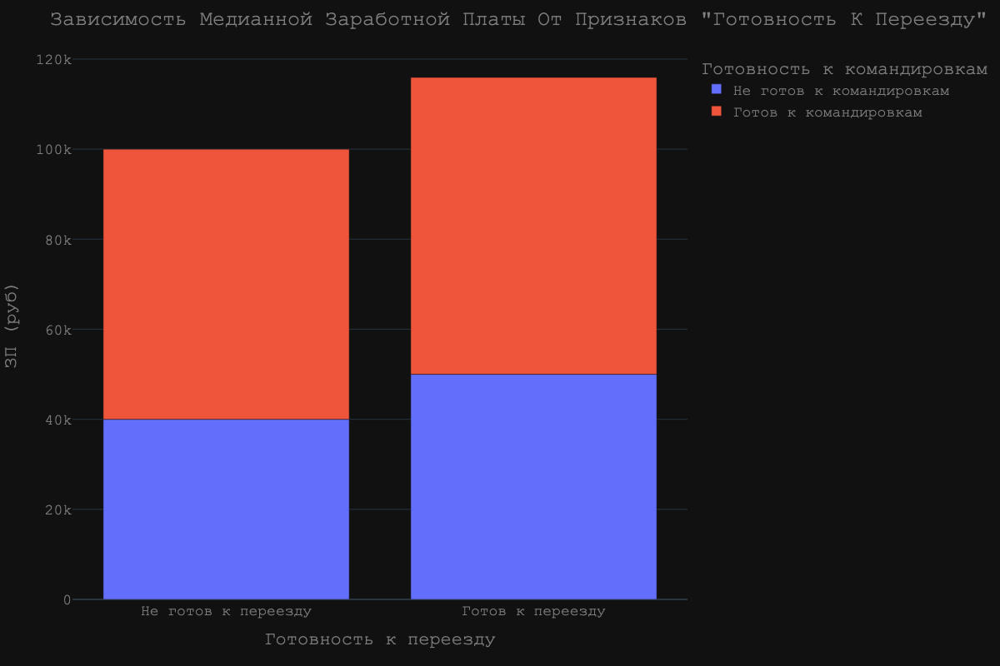

In [127]:
df_salary_relocation = df.groupby(["Готовность к переезду", "Готовность к командировкам"]).agg({"ЗП (руб)": "median"}).reset_index()

df_salary_relocation["Готовность к переезду"] = df_salary_relocation["Готовность к переезду"].apply(lambda row: "Готов к переезду" if row else "Не готов к переезду")
df_salary_relocation["Готовность к командировкам"] = df_salary_relocation["Готовность к командировкам"].apply(lambda row: "Готов к командировкам" if row else "Не готов к командировкам")

fig = px.bar(
    df_salary_relocation,
    x="Готовность к переезду",
    y="ЗП (руб)",
    color="Готовность к командировкам",
)

fig.update_layout(
    title='Зависимость медианной заработной платы от признаков "Готовность к переезду" и "Готовность к командировкам"'.title(),
    xaxis_title="Готовность к переезду",
    yaxis_title="ЗП (руб)",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    )
)

fig.show(renderer="png", width=1200, height=800)



Персона готовая к переезду и к командировкам имеет больший уровень ЗП, чем персона не готовая к переезду и готовая к командировкам. Персона готовая к переезду и не готовая к командировкам имеет больший уровень ЗП, чем персона не готовая к переезду и не готовая к командировкам.
Спрос на специалистов, готовых к смене локации выше и как следствие, работодатели готовы платить больше.

7. Постройте сводную таблицу, иллюстрирующую зависимость **медианной** желаемой заработной платы от возраста (**"Возраст"**) и образования (**"Образование"**). На полученной сводной таблице постройте **тепловую карту**. Проанализируйте тепловую карту, сравнив показатели внутри групп.

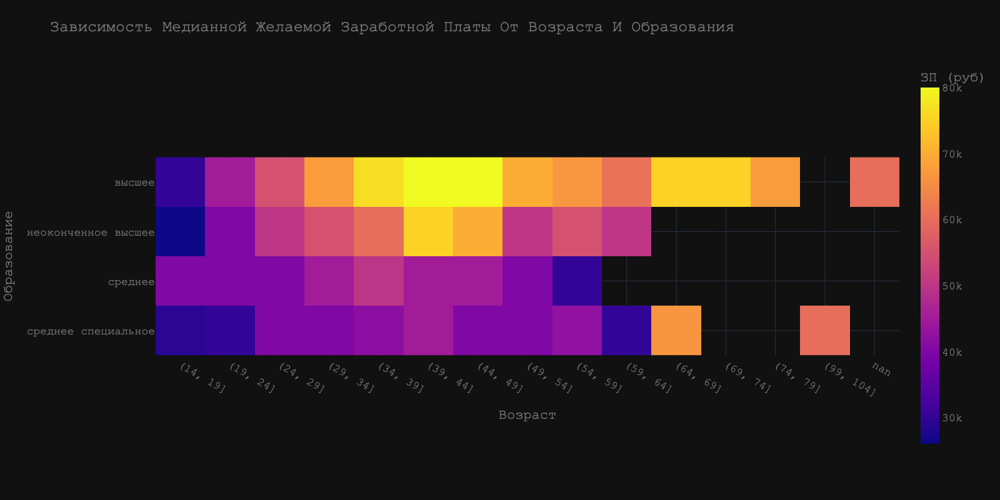

In [128]:
bins = list(range(14, 110, 5))
df['Возраст группа'] = pd.cut(df['Возраст'], bins)
df['Возраст группа'] = df['Возраст группа'].astype(str)
t = df.pivot_table(
    index="Возраст группа",
    columns="Образование",
    values="ЗП (руб)",
    aggfunc="median",
)

fig = px.imshow(
    t.transpose(),
    title="Зависимость медианной желаемой заработной платы от возраста и образования",
    labels={
        "x": "Возраст",
        "y": "Образование",
        "color": "ЗП (руб)"
    },
    color_continuous_scale=px.colors.sequential.Plasma,
)

fig.update_layout(
    title='Зависимость медианной желаемой заработной платы от возраста и образования'.title(),
    xaxis_title="Возраст",
    yaxis_title="Образование",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    ),
)

fig.show(renderer="png", width=1600, height=800)

### Анализ распределения групп
#### По текущей визуализации можно сказать, что самый быстрый карьерный рост, наблюдается у людей с высшим образованием.

8. Постройте **диаграмму рассеяния**, показывающую зависимость опыта работы (**"Опыт работы (месяц)"**) от возраста (**"Возраст"**). Опыт работы переведите из месяцев в года, чтобы признаки были в едином масштабе. Постройте на графике дополнительно прямую, проходящую через точки (0, 0) и (100, 100). Данная прямая соответствует значениям, когда опыт работы равен возрасту человека. Точки, лежащие на этой прямой и выше нее - аномалии в наших данных (опыт работы больше либо равен возрасту соискателя)

In [129]:
df["Опыт работы (год)"] = df["Опыт работы (месяц)"] / 12
fig = px.scatter(
    df,
    x="Возраст",
    y="Опыт работы (год)",
    title="Зависимость опыта работы от возраста",
    labels={
        "x": "Возраст",
        "y": "Опыт работы (год)"
    },
    color="Опыт работы (год)",
    color_continuous_scale=px.colors.sequential.Plasma,
)
fig.add_trace(
    go.Scatter(
        x=[0, 100],
        y=[0, 100],
        mode="lines",
        name="Опыт работы = Возраст",
    )
)
fig.update_layout(
    title='Зависимость опыта работы от возраста'.title(),
    xaxis_title="Возраст",
    yaxis_title="Опыт работы (год)",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    ),
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    )
)

fig.show(render="png", width=1600, height=800)

In [130]:
print("Сколько точек лежат строго выше построенной прямой? ")
df[df["Опыт работы (год)"] >= df["Возраст"]].shape[0]

Сколько точек лежат строго выше построенной прямой? 


7

ваши выводы здесь

**Дополнительные баллы**

Для получения 2 дополнительных баллов по разведывательному анализу постройте еще два любых содержательных графика или диаграммы, которые помогут проиллюстрировать влияние признаков/взаимосвязь между признаками/распределения признаков. Приведите выводы по ним. Желательно, чтобы в анализе участвовали признаки, которые мы создавали ранее в разделе "Преобразование данных".


In [131]:
# времени не было приступить :(

ваши выводы здесь

# Очистка данных

1. Начнем с дубликатов в наших данных. Найдите **полные дубликаты** в таблице с резюме и удалите их. 

In [132]:
print("Количество дубликатов в таблице с резюме:")
print(len(df) - len(df.drop_duplicates()))
assert len(df) - len(df.drop_duplicates()) == 161
df.drop_duplicates(inplace=True)

Количество дубликатов в таблице с резюме:
161


2. Займемся пропусками. Выведите информацию **о числе пропусков** в столбцах. 

In [133]:
print("Число пропусков в столбцах:")
df.isna().sum()

Число пропусков в столбцах:


Ищет работу на должность:            0
Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
Обновление резюме                    0
Авто                                 0
Образование                          0
Пол                                  0
Возраст                              0
Опыт работы (месяц)                168
Город                                0
Готовность к переезду                0
Готовность к командировкам           0
полная занятость                     0
полный день                          0
частичная занятость                  0
сменный график                       0
проектная работа                     0
гибкий график                        0
волонтерство                         0
удаленная работа                     0
стажировка                           0
вахтовый метод                       0
ЗП (руб)                             0
Возраст группа                       0
Опыт работы (год)                  168
dtype: int64

# Задание 5.2
Сколько пропусков в столбце «Опыт работы (месяц)»?

In [134]:
print("Число пропусков в столбце «Опыт работы (месяц)»:")
print(df["Опыт работы (месяц)"].isna().sum())
assert df["Опыт работы (месяц)"].isna().sum() == 168

Число пропусков в столбце «Опыт работы (месяц)»:
168


3. Итак, у нас есть пропуски в 3ех столбцах: **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**. Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью. Пропуски в столбце с опытом работы заполните **медианным** значением.

In [135]:
df.dropna(subset=["Последнее/нынешнее место работы", "Последняя/нынешняя должность"], inplace=True)
df["Опыт работы (месяц)"].fillna(df["Опыт работы (месяц)"].median(), inplace=True)

# Задание 5.3
Чему равно результирующее среднее значение в столбце «Опыт работы (месяц)» после заполнения пропусков? Ответ округлите до целых.

In [136]:
print("Результирующее среднее значение в столбце «Опыт работы (месяц)» после заполнения пропусков:")
print(round(df["Опыт работы (месяц)"].mean()))
assert round(df["Опыт работы (месяц)"].mean()) == 114

Результирующее среднее значение в столбце «Опыт работы (месяц)» после заполнения пропусков:
114


4. Мы добрались до ликвидации выбросов. Сначала очистим данные вручную. Удалите резюме, в которых указана заработная плата либо выше 1 млн. рублей, либо ниже 1 тыс. рублей.

In [137]:

prev_len = len(df)
df = df[(df["ЗП (руб)"] <= 1_000_000) & (df["ЗП (руб)"] >= 1_000)]
curr_len = len(df)
print(f"Удалено {prev_len - curr_len} резюме")

Удалено 89 резюме


# Задание 5.4
Сколько выбросов вы нашли?


In [138]:
print("Количество выбросов:")
print(prev_len - curr_len)
assert prev_len - curr_len == 89

Количество выбросов:
89


5. В процессе разведывательного анализа мы обнаружили резюме, в которых **опыт работы в годах превышал возраст соискателя**. Найдите такие резюме и удалите их из данных


In [139]:
prev_len = len(df)
df = df[~(df["Возраст"] < df["Опыт работы (год)"])]
curr_len = len(df)
print(f"Удалено {prev_len - curr_len} резюме")

Удалено 7 резюме


# Задание 5.5
Сколько выбросов вы нашли?

In [140]:
print("Количество выбросов:")
print(prev_len - curr_len)
assert prev_len - curr_len == 7

Количество выбросов:
7


6. В результате анализа мы обнаружили потенциальные выбросы в признаке **"Возраст"**. Это оказались резюме людей чересчур преклонного возраста для поиска работы. Попробуйте построить распределение признака в **логарифмическом масштабе**. Добавьте к графику линии, отображающие **среднее и границы интервала метода трех сигм**. Напомним, сделать это можно с помощью метода axvline. Например, для построение линии среднего будет иметь вид:

`histplot.axvline(log_age.mean(), color='k', lw=2)`

В какую сторону асимметрично логарифмическое распределение? Напишите об этом в комментарии к графику.
Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. Давайте сделаем послабление на **1 сигму** (возьмите 4 сигмы) в **правую сторону**.

Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

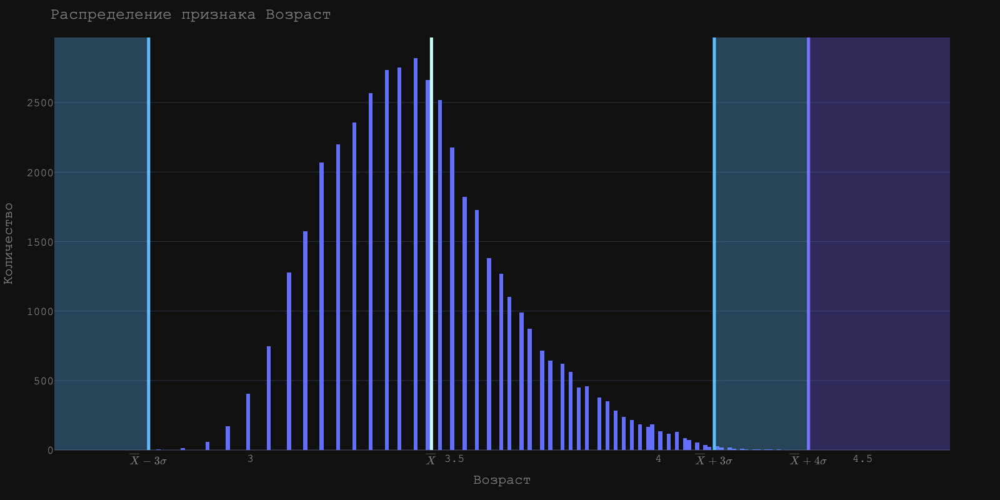

In [141]:
df["Возраст (лог)"] = np.log(df["Возраст"])
sigma = df["Возраст (лог)"].std()
mean = df["Возраст (лог)"].mean()

fig = px.histogram(df, x='Возраст (лог)')
fig.update_layout(
    title="Распределение признака Возраст",
    xaxis_title="Возраст",
    yaxis_title="Количество",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    )
)

fig.add_vline(x=mean, line_width=5, line_color="#C5FFF8", annotation_text="$\overline{X}$", annotation_position="bottom")
fig.add_vline(x=mean + 4 * sigma, line_width=5, line_color="#7B66FF", annotation_text="$\overline{X} + 4\sigma$ < ", annotation_position="bottom")
fig.add_vrect(x0=mean + 4 * sigma, x1=mean + 5.5 * sigma, line_width=0, fillcolor="#7B66FF", opacity=0.3)

fig.add_vline(x=mean + 3 * sigma, line_width=5, line_color="#5FBDFF", annotation_text="$\overline{X} + 3\sigma$ < ", annotation_position="bottom")
fig.add_vrect(x0=mean + 3 * sigma, x1=mean + 4 * sigma, line_width=0, fillcolor="#5FBDFF", opacity=0.3)

fig.add_vline(x=mean - 3 * sigma, line_width=5, line_color="#5FBDFF", annotation_text="$\overline{X} - 3\sigma$ < ", annotation_position="bottom")
fig.add_vrect(x0=mean - 3 * sigma, x1=mean - 4 * sigma, line_width=0, fillcolor="#5FBDFF", opacity=0.3)

fig.show(renderer="png", width=1600, height=800)


# В какую сторону асимметрично логарифмическое распределение?
Так как мода располагается левее среднего значение, то распределение асимметрично вправо. Наблюдается правосторонняя асимметрия.

Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. Давайте сделаем послабление на **1 сигму** (возьмите 4 сигмы) в **правую сторону**.

In [142]:
print("Количество выбросов:")
n_emissions = df[(df["Возраст (лог)"] > (mean + 4 * sigma)) | (df["Возраст (лог)"] < mean - 3 * sigma)]
print(len(n_emissions))
assert len(n_emissions) == 3

Количество выбросов:
3
